# Read data set

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
data = pd.read_csv('/content/drive/My Drive/Litech_assignment_data.csv')

The dataset consists of sensor measurements recorded as complex numbers. We collect
data at six different frequencies ranging from 2000 Hz to 20,000 Hz in every sample.

detection_time: Timestamp of when the measurement was taken.

● Real Components:

- r_2000: Real component of the magnetic field at 2000 Hz.

- r_4000: Real component of the magnetic field at 4000 Hz.

- r_8000: Real component of the magnetic field at 8000 Hz.

- r_10000: Real component of the magnetic field at 10,000 Hz.

- r_16000: Real component of the magnetic field at 16,000 Hz.

- r_20000: Real component of the magnetic field at 20,000 Hz.

● Imaginary Components:

- i_2000: Imaginary component of the magnetic field at 2000 Hz.

- i_4000: Imaginary component of the magnetic field at 4000 Hz.

- i_8000: Imaginary component of the magnetic field at 8000 Hz.

- i_10000: Imaginary component of the magnetic field at 10,000 Hz.

- i_16000: Imaginary component of the magnetic field at 16,000 Hz.

- i_20000: Imaginary component of the magnetic field at 20,000 Hz.


In [ ]:
# Check the dataset
data.head()

,detection_time,time_stamp,coil_index,r_2000,r_4000,r_8000,r_10000,r_16000,r_20000,i_2000,i_4000,i_8000,i_10000,i_16000,i_20000
0,08192024_112427_426,08192024_112343_973,101,0.003533,0.018009,0.061600,0.089311,0.166956,0.215712,0.039798,0.087056,0.162034,0.194247,0.250458,0.274146
1,08192024_112427_439,08192024_112343_973,100,0.011207,0.015056,0.062014,0.081796,0.191432,0.196606,0.041050,0.109225,0.179182,0.234876,0.312767,0.338925
2,08192024_112427_439,08192024_112343_973,101,0.007362,0.039101,0.107232,0.156024,0.285359,0.352663,0.062025,0.142517,0.251116,0.289529,0.352644,0.380210
3,08192024_112427_439,08192024_112343_973,102,-0.000007,0.016547,0.057931,0.080201,0.150351,0.188211,0.037468,0.086174,0.154265,0.182217,0.230439,0.250874
4,08192024_112427_445,08192024_112343_973,100,0.006539,0.019925,0.086487,0.123695,0.242368,0.320411,0.057700,0.144373,0.260728,0.301430,0.379065,0.413445


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 989141 entries, 0 to 989140
Data columns (total 15 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   detection_time  989141 non-null  object 
 1   time_stamp      989141 non-null  object 
 2   coil_index      989141 non-null  int64  
 3   r_2000          989141 non-null  float64
 4   r_4000          989141 non-null  float64
 5   r_8000          989141 non-null  float64
 6   r_10000         989141 non-null  float64
 7   r_16000         989141 non-null  float64
 8   r_20000         989141 non-null  float64
 9   i_2000          989141 non-null  float64
 10  i_4000          989141 non-null  float64
 11  i_8000          989141 non-null  float64
 12  i_10000         989141 non-null  float64
 13  i_16000         989141 non-null  float64
 14  i_20000         989141 non-null  float64
dtypes: float64(12), int64(1), object(2)
memory usage: 113.2+ MB


# Data Preprocessing

1. What steps would you take to clean and preprocess the dataset?
- How would you handle missing or incomplete data?
- What methods would you use to address any inconsistencies or errors in the
dataset?
- How would you transform or normalize the data for analysis?


In [ ]:
# Drop time_stamp
df = data.copy()
df.drop(['time_stamp'], axis=1, inplace=True)

In [ ]:
df.sort_values(by=['coil_index', 'detection_time'], ascending = True, inplace=True)

In [ ]:
# Extract numeric part of detection_time and convert to numeric type
df['detection_time_numeric'] = df['detection_time'].str.replace('_s', '').astype(float)

# Calculate time steps
time_steps = [0]  # Initialize with 0 for the first time step
# Use .iloc to access rows by their position
for i in range(1, len(df)):
    time_step = df.iloc[i]['detection_time_numeric'] - df.iloc[i-1]['detection_time_numeric']
    time_steps.append(time_step)

# Add time steps as a new column
df['time_step'] = time_steps
df['time_step'].describe()

,time_step
count,9.891410e+05
mean,1.010981e+07
std,9.591521e+10
min,-1.000005e+13
25%,7.000000e+00
50%,1.100000e+01
75%,1.200000e+01
max,9.999764e+12


**Resampling**

In [ ]:
df.head()

,detection_time,coil_index,r_2000,r_4000,r_8000,r_10000,r_16000,r_20000,i_2000,i_4000,i_8000,i_10000,i_16000,i_20000,detection_time_numeric,time_step
51986,08192024_112040_778,8,0.013193,0.026037,0.082172,0.116158,0.230046,0.298275,0.043744,0.090076,0.160348,0.190412,0.224794,0.220572,8.192024e+15,0.0
51991,08192024_112040_788,8,0.016259,0.034419,0.100957,0.141861,0.269731,0.356225,0.050872,0.101588,0.182895,0.212967,0.243598,0.227455,8.192024e+15,10.0
51996,08192024_112040_798,8,0.018998,0.041367,0.118090,0.168142,0.327901,0.426271,0.059287,0.122793,0.219585,0.253415,0.289045,0.273839,8.192024e+15,10.0
52001,08192024_112040_808,8,0.018340,0.043991,0.126570,0.185027,0.358055,0.466845,0.067718,0.138288,0.245300,0.284541,0.327570,0.313975,8.192024e+15,10.0
52004,08192024_112040_818,8,0.019060,0.046294,0.131809,0.189199,0.369646,0.486161,0.069921,0.142624,0.256443,0.297428,0.344179,0.332985,8.192024e+15,10.0


In [ ]:
# get the coil index back at columns

df = data.copy()
df.drop(['time_stamp'], axis=1, inplace=True)
df.sort_values(by=['detection_time', 'coil_index'], inplace=True)
df_real = df.filter(regex='r_')
df_imaginary = df.filter(regex='i_')

coil_index = df['coil_index']
detection_time = df['detection_time']

df_imaginary['coil_index'] = coil_index
df_real['coil_index'] = coil_index
df_imaginary['detection_time'] = pd.to_datetime(detection_time, format='%m%d%Y_%H%M%S_%f')
df_real['detection_time'] = pd.to_datetime(detection_time, format='%m%d%Y_%H%M%S_%f')

df_combined = df_real.copy()
df_combined = df_combined.merge(df_imaginary, on=['coil_index', 'detection_time'], suffixes=('real', 'imaginary'))
df_combined.head()

<ipython-input-9-4e429110eee9>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_imaginary['coil_index'] = coil_index
<ipython-input-9-4e429110eee9>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_real['coil_index'] = coil_index
<ipython-input-9-4e429110eee9>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

,r_2000,r_4000,r_8000,r_10000,r_16000,r_20000,coil_index,detection_time,i_2000,i_4000,i_8000,i_10000,i_16000,i_20000
0,0.004118,-0.001041,0.008549,0.021216,0.070206,0.117311,11,2024-08-19 09:26:50.449,-0.078656,-0.173014,-0.343928,-0.432346,-0.670635,-0.821727
1,0.006725,0.003673,0.007460,0.012701,0.036684,0.059898,13,2024-08-19 09:26:50.449,0.027791,0.068388,0.146874,0.185631,0.301914,0.375605
2,-0.001000,0.002791,0.009738,0.016392,0.041974,0.064422,18,2024-08-19 09:26:50.449,0.041383,0.075000,0.147631,0.183125,0.289161,0.361938
3,0.028856,0.034535,0.072203,0.100687,0.215823,0.303189,40,2024-08-19 09:26:50.449,-0.081092,-0.183460,-0.366572,-0.443753,-0.655733,-0.757057
4,-0.052638,-0.047633,-0.021125,-0.003441,0.068310,0.124193,44,2024-08-19 09:26:50.449,-0.073717,-0.146571,-0.297907,-0.367790,-0.564568,-0.674258


In [ ]:
# Extract frequency, real, and imaginary values
df_melted = pd.melt(df_combined,
                     id_vars=['coil_index', 'detection_time'],
                     var_name='frequency',
                     value_name='value')

# Extract the integer part of the frequency and store it in a new column
df_melted['frequency_int'] = df_melted['frequency'].str.split('_').str[1].astype(int)

df_real = df_melted[df_melted['frequency'].str.startswith('r_')].copy()
df_real['real'] = df_real['value']
df_real.drop('value', axis=1, inplace=True)

df_imaginary = df_melted[df_melted['frequency'].str.startswith('i_')].copy()
df_imaginary['imaginary'] = df_imaginary['value']
df_imaginary.drop('value', axis=1, inplace=True)

# Merge real and imaginary values back into the main DataFrame
# Use the 'frequency_int' column for merging
df_final = df_melted.merge(df_real, on=['coil_index', 'detection_time', 'frequency_int'], how='left')
df_final = df_final.merge(df_imaginary, on=['coil_index', 'detection_time', 'frequency_int'], how='left')

df_final.drop(['frequency_x','frequency_y', 'frequency', 'value'], axis=1, inplace=True)
df_final.head()


,coil_index,detection_time,frequency_int,real,imaginary
0,11,2024-08-19 09:26:50.449,2000,0.004118,-0.078656
1,13,2024-08-19 09:26:50.449,2000,0.006725,0.027791
2,18,2024-08-19 09:26:50.449,2000,-0.001000,0.041383
3,40,2024-08-19 09:26:50.449,2000,0.028856,-0.081092
4,44,2024-08-19 09:26:50.449,2000,-0.052638,-0.073717


In [ ]:
df_final.isna().any()

,0
coil_index,False
detection_time,False
frequency_int,False
real,False
imaginary,False


In [ ]:
df_final.drop_duplicates(inplace=True)
df_final.duplicated().any()

False

In [ ]:
df_final.set_index('coil_index', inplace=True)
df_final.sort_index(inplace=True, ascending=True)
df_final.sort_values(by=['detection_time'], ascending=True, inplace=True)
df_final.head()

,detection_time,frequency_int,real,imaginary
coil_index,,,,
40,2024-08-19 09:26:50.449,8000,0.072203,-0.366572
100,2024-08-19 09:26:50.449,2000,-0.011297,0.034891
102,2024-08-19 09:26:50.449,4000,0.001762,0.103690
75,2024-08-19 09:26:50.449,16000,0.150070,-0.988412
13,2024-08-19 09:26:50.449,4000,0.003673,0.068388


In [ ]:
df_final.reset_index(inplace=True)
df_final.head()

,coil_index,detection_time,frequency_int,real,imaginary
0,40,2024-08-19 09:26:50.449,8000,0.072203,-0.366572
1,100,2024-08-19 09:26:50.449,2000,-0.011297,0.034891
2,102,2024-08-19 09:26:50.449,4000,0.001762,0.103690
3,75,2024-08-19 09:26:50.449,16000,0.150070,-0.988412
4,13,2024-08-19 09:26:50.449,4000,0.003673,0.068388


In [ ]:
df_final.sort_values(by=['detection_time', 'coil_index'], ascending=True, inplace=True)
df_final.reset_index(inplace=True, drop=True)
df_final.head()

,coil_index,detection_time,frequency_int,real,imaginary
0,11,2024-08-19 09:26:50.449,20000,0.117311,-0.821727
1,11,2024-08-19 09:26:50.449,16000,0.070206,-0.670635
2,11,2024-08-19 09:26:50.449,2000,0.004118,-0.078656
3,11,2024-08-19 09:26:50.449,10000,0.021216,-0.432346
4,11,2024-08-19 09:26:50.449,4000,-0.001041,-0.173014


In [ ]:

import pandas as pd

resampled_dfs = []
for coil_index in df_final['coil_index'].unique():
    df_coil = df_final[df_final['coil_index'] == coil_index].copy()
    df_coil['detection_time'] = pd.to_datetime(df_coil['detection_time'], format='%m%d%Y_%H%M%S_%f')
    df_coil.set_index('detection_time', inplace=True)

    # Group by frequency and resample each group separately
    df_coil_resampled = df_coil.groupby('frequency_int').resample('S').mean().interpolate()
    df_coil_resampled.rename(columns={'frequency_int': 'frequency'}, inplace=True)
    df_coil_resampled.drop(['frequency'], axis=1, inplace=True)
    df_coil_resampled['coil_index'] = coil_index
    # Reset the index to bring 'detection_time' and 'frequency_int' back as columns
    df_coil_resampled.reset_index(inplace=True)
    resampled_dfs.append(df_coil_resampled)

# Concatenate resampled data for all coils
df_final_resampled = pd.concat(resampled_dfs, ignore_index=True)

# Sort the final DataFrame, now that 'detection_time' is a column
df_final_resampled.sort_values(by=['detection_time', 'coil_index', 'frequency_int'], ascending=True, inplace=True)
df_final_resampled.reset_index(drop=True, inplace=True)

df_final_resampled.head()


,frequency_int,detection_time,coil_index,real,imaginary
0,2000,2024-08-19 09:26:50,11,0.004118,-0.078656
1,4000,2024-08-19 09:26:50,11,-0.001041,-0.173014
2,8000,2024-08-19 09:26:50,11,0.008549,-0.343928
3,10000,2024-08-19 09:26:50,11,0.021216,-0.432346
4,16000,2024-08-19 09:26:50,11,0.070206,-0.670635


**Feature engineering**

In [ ]:
# Define the frequencies

import numpy as np
frequencies = [2000, 4000, 8000, 10000, 16000, 20000]

df_final_resampled['complex'] = df_final_resampled.real + 1j * df_final_resampled.imaginary
df_final_resampled['magnitude'] = np.abs(df_final_resampled['complex'])
df_final_resampled['phase'] = np.angle(df_final_resampled['complex'])
df_final_resampled['power'] = np.abs(df_final_resampled['complex'])**2

In [ ]:
df_final_resampled.head()

,frequency_int,detection_time,coil_index,real,imaginary,complex,magnitude,phase,power
0,2000,2024-08-19 09:26:50,11,0.004118,-0.078656,0.004118-0.078656j,0.078763,-1.518486,0.006204
1,4000,2024-08-19 09:26:50,11,-0.001041,-0.173014,-0.001041-0.173014j,0.173017,-1.576811,0.029935
2,8000,2024-08-19 09:26:50,11,0.008549,-0.343928,0.008549-0.343928j,0.344034,-1.545944,0.118359
3,10000,2024-08-19 09:26:50,11,0.021216,-0.432346,0.021216-0.432346j,0.432866,-1.521763,0.187373
4,16000,2024-08-19 09:26:50,11,0.070206,-0.670635,0.070206-0.670635j,0.674300,-1.466490,0.454681


# Initial visualizations

**Average power spectra**

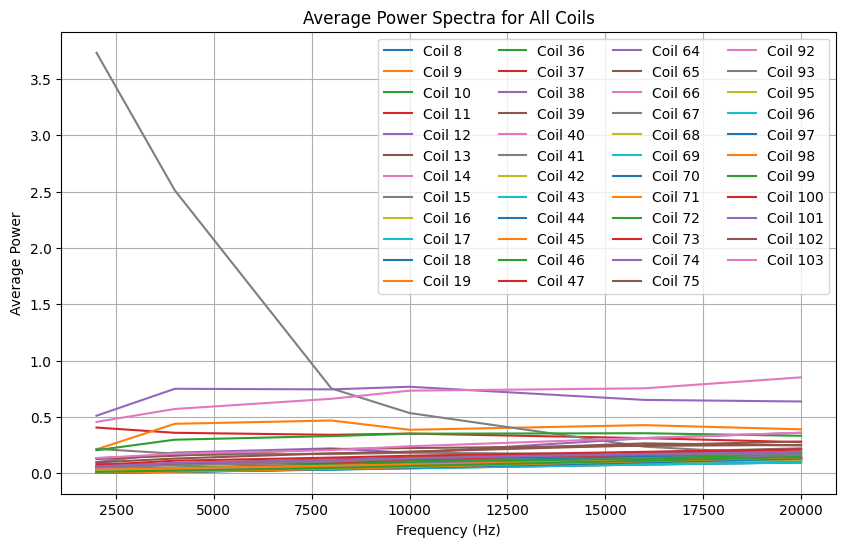

In [ ]:

import matplotlib.pyplot as plt
import numpy as np

# Calculate average power for each coil and frequency
average_power = df_final_resampled.groupby(['coil_index', 'frequency_int'])['power'].mean().reset_index()

# Plot the average power spectrum for each coil
plt.figure(figsize=(10, 6))
for coil_index in average_power['coil_index'].unique():
    df_coil = average_power[average_power['coil_index'] == coil_index]
    plt.plot(df_coil['frequency_int'], df_coil['power'], label=f'Coil {coil_index}')

plt.xlabel('Frequency (Hz)')
plt.ylabel('Average Power')
plt.title('Average Power Spectra for All Coils')
plt.legend(ncol=4)
plt.grid(True)
plt.show()

**Power density spectra**

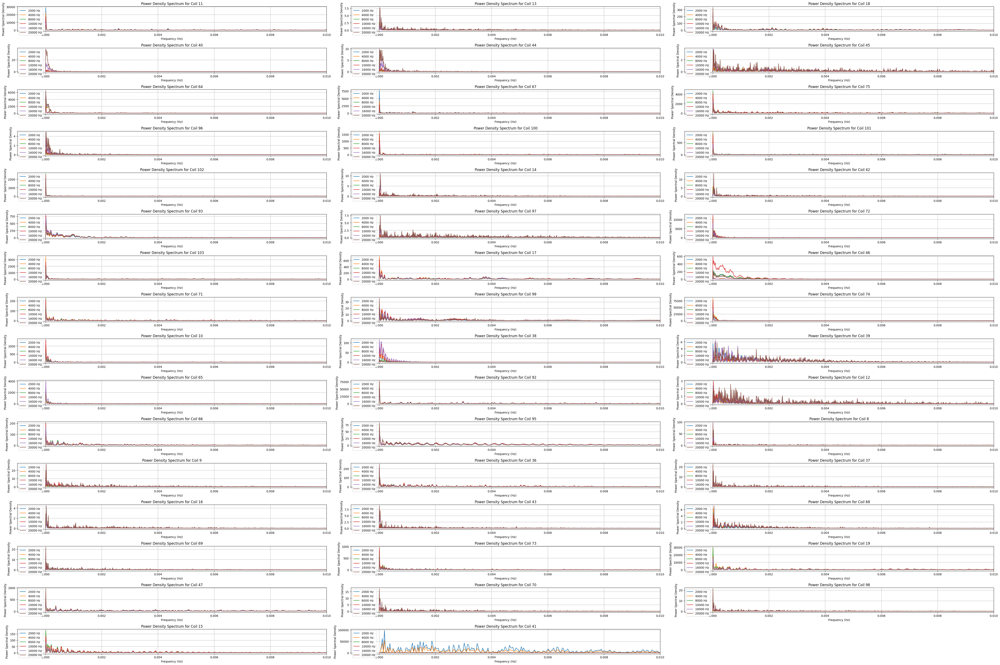

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import scipy.signal as signal

plt.figure(figsize=(48, 32))

# Determine the number of coils to adjust subplot layout
num_coils = df_final_resampled['coil_index'].nunique()
num_rows = (num_coils + 2) // 3  # Calculate rows needed, ensuring enough space

for i, coil_index in enumerate(df_final_resampled['coil_index'].unique()):
    df_coil = df_final_resampled[df_final_resampled['coil_index'] == coil_index]

    plt.subplot(num_rows, 3, i + 1)  # Dynamically adjust subplot grid

    for frequency in df_coil['frequency_int'].unique():
        df_freq = df_coil[df_coil['frequency_int'] == frequency]
        f, Pxx_den = signal.periodogram(df_freq['power'], fs=1)
        plt.plot(f, Pxx_den, label=f'{frequency} Hz')

    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power Spectral Density')
    plt.title(f'Power Density Spectrum for Coil {coil_index}')
    plt.xlim(-0.001, 0.01)
    plt.legend()
    plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
# Check for missing values
missing = df_final_resampled.isnull().any()
print("Missing values:\n", missing)

Missing values:
 frequency_int     False
detection_time    False
coil_index        False
real              False
imaginary         False
complex           False
magnitude         False
phase             False
power             False
dtype: bool


In [ ]:
# Check for duplicates
duplicates = df_final_resampled.duplicated().sum()
print("Duplicate rows:", duplicates)
df.drop_duplicates(inplace=True)

Duplicate rows: 0


2. What techniques would you use to detect and manage outliers in the dataset?

Loading and Inspecting Data

Data Preprocessing

Box Plots

QQ Plots

Correlation Heatmap

Clustering with KMeans

Anomaly Detection with Isolation Forest

Predictive Modeling with Decision Tree

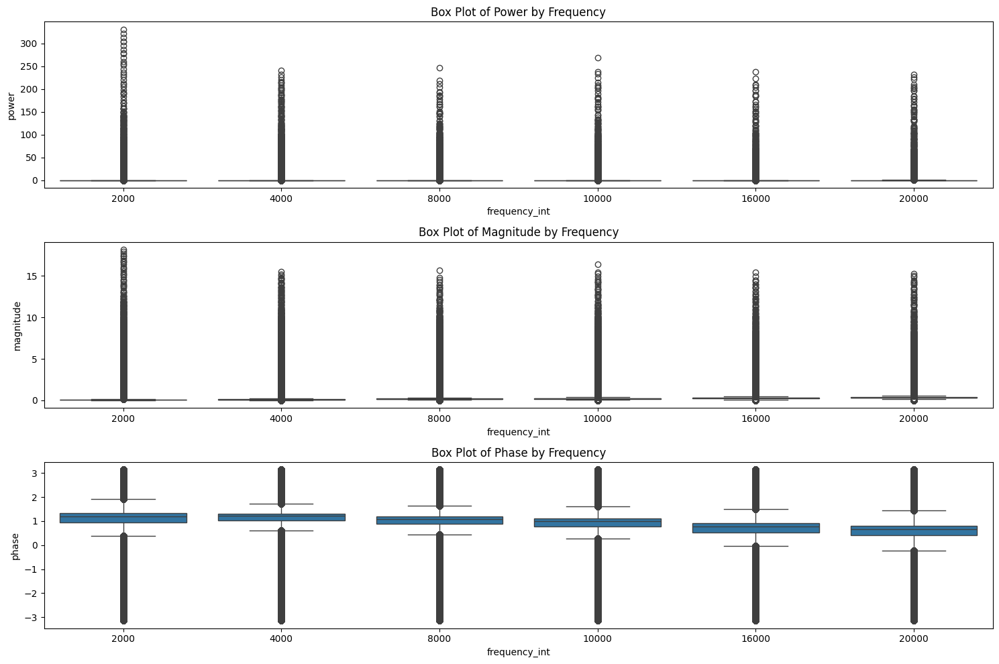

In [ ]:
#  plot box plots for df_final_resampled for power, magnitude and phase per frequency

import seaborn as sns

plt.figure(figsize=(15, 10))

# Power
plt.subplot(3, 1, 1)
sns.boxplot(x='frequency_int', y='power', data=df_final_resampled)
plt.title('Box Plot of Power by Frequency')

# Magnitude
plt.subplot(3, 1, 2)
sns.boxplot(x='frequency_int', y='magnitude', data=df_final_resampled)
plt.title('Box Plot of Magnitude by Frequency')

# Phase
plt.subplot(3, 1, 3)
sns.boxplot(x='frequency_int', y='phase', data=df_final_resampled)
plt.title('Box Plot of Phase by Frequency')

plt.tight_layout()
plt.show()


/usr/local/lib/python3.10/dist-packages/pandas/core/internals/managers.py:1715: ComplexWarning: Casting complex values to real discards the imaginary part
  result[rl.indexer] = arr


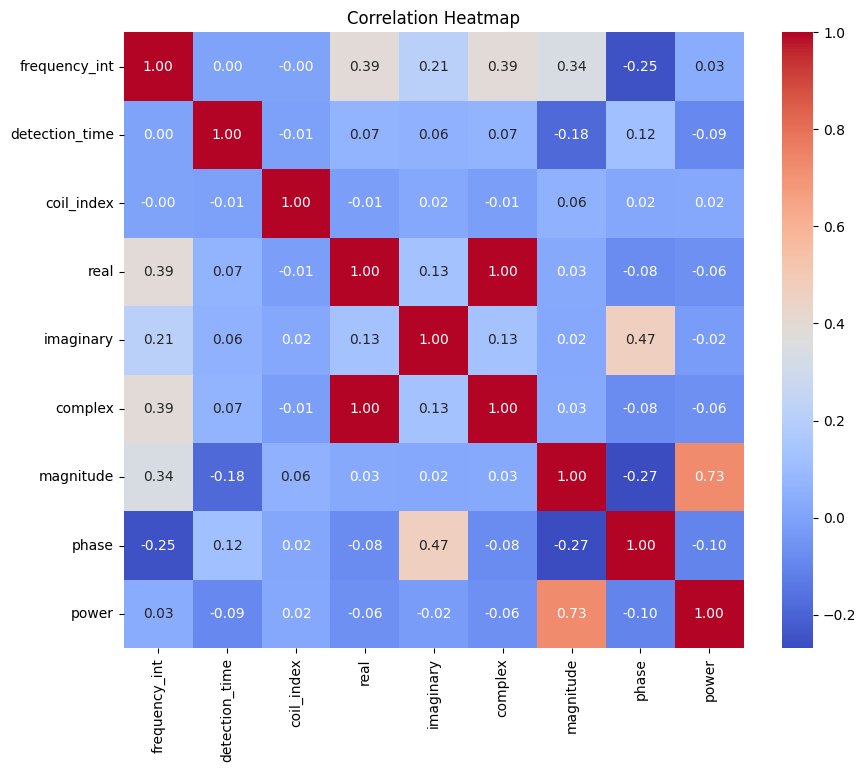

In [ ]:
# plot correlation plot

# Calculate the correlation matrix
correlation_matrix = df_final_resampled.corr()

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()


In [ ]:
df_final_resampled.info()

list(df_final_resampled.columns)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28157550 entries, 0 to 28157549
Data columns (total 9 columns):
 #   Column          Dtype         
---  ------          -----         
 0   frequency_int   int64         
 1   detection_time  datetime64[ns]
 2   coil_index      int64         
 3   real            float64       
 4   imaginary       float64       
 5   complex         complex128    
 6   magnitude       float64       
 7   phase           float64       
 8   power           float64       
dtypes: complex128(1), datetime64[ns](1), float64(5), int64(2)
memory usage: 2.1 GB


['frequency_int',
 'detection_time',
 'coil_index',
 'real',
 'imaginary',
 'complex',
 'magnitude',
 'phase',
 'power']

In [ ]:
df_final_resampled.sort_values(by=['detection_time', 'coil_index'], ascending=True, inplace=True)
detection_time = df_final_resampled.detection_time


In [ ]:
df_final_resampled.head()

,frequency_int,detection_time,coil_index,real,imaginary,complex,magnitude,phase,power
0,2000,2024-08-19 09:26:50,11,0.004118,-0.078656,0.004118-0.078656j,0.078763,-1.518486,0.006204
1,4000,2024-08-19 09:26:50,11,-0.001041,-0.173014,-0.001041-0.173014j,0.173017,-1.576811,0.029935
2,8000,2024-08-19 09:26:50,11,0.008549,-0.343928,0.008549-0.343928j,0.344034,-1.545944,0.118359
3,10000,2024-08-19 09:26:50,11,0.021216,-0.432346,0.021216-0.432346j,0.432866,-1.521763,0.187373
4,16000,2024-08-19 09:26:50,11,0.070206,-0.670635,0.070206-0.670635j,0.674300,-1.466490,0.454681


In [ ]:
# prompt: get a subset from df final resampled random

# Assuming 'df_final_resampled' is your DataFrame
subset = df_final_resampled.sample(n=500)  # Get 100 random samples


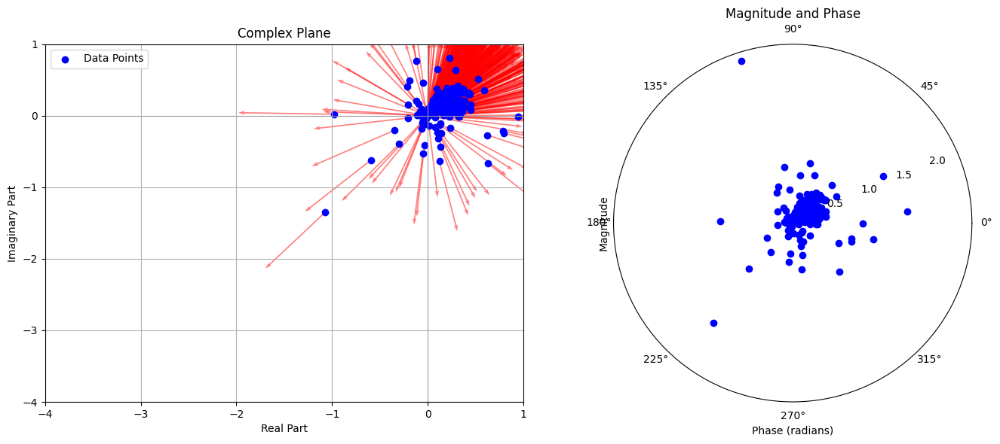

In [ ]:
# Set up the figure
plt.figure(figsize=(14, 6))

# 1. Complex Plane Plot
plt.subplot(1, 2, 1)
plt.quiver(subset.real, subset.imaginary,
           np.cos(subset.phase), np.sin(subset.phase),
           angles='xy', scale_units='xy', scale=1, color='r', alpha=0.5)
plt.scatter(subset.real, subset.imaginary, color='b', label='Data Points')
plt.axhline(0, color='grey', linewidth=0.5, linestyle='--')
plt.axvline(0, color='grey', linewidth=0.5, linestyle='--')
plt.title('Complex Plane')
plt.xlabel('Real Part')
plt.ylabel('Imaginary Part')
plt.grid()
plt.xlim(-4, 1)
plt.ylim(-4, 1)
plt.legend()

# 2. Polar Plot (Magnitude and Phase)
plt.subplot(1, 2, 2, polar=True)
theta = subset.phase  # phase in radians
radii = subset.magnitude  # magnitude
plt.scatter(theta, radii, color='b', label='Magnitude')
plt.title('Magnitude and Phase')
plt.xlabel('Phase (radians)')
plt.ylabel('Magnitude')
plt.grid()

plt.tight_layout()
plt.show()

In [ ]:
df_final_resampled.drop(['detection_time','coil_index', 'complex'], axis=1, inplace=True)

In [ ]:
# scale the data

from sklearn.preprocessing import StandardScaler

# Create a scaler object
scaler = StandardScaler()

# Fit the scaler to the numerical columns and transform the data
df_scaled = scaler.fit_transform(df_final_resampled)

# Create a new DataFrame with the scaled numerical columns
df_scaled = pd.DataFrame(df_scaled)
df_scaled.columns = df_final_resampled.columns


In [ ]:
df_scaled.head()

,frequency_int,real,imaginary,magnitude,phase,power
0,-1.264911,-0.477917,-0.929671,-0.643331,-3.153512,-0.131859
1,-0.948683,-0.499290,-1.344137,-0.302083,-3.231683,-0.108825
2,-0.316228,-0.459560,-2.094874,0.317091,-3.190312,-0.023000
3,0.000000,-0.407082,-2.483249,0.638711,-3.157904,0.043985
4,0.948683,-0.204123,-3.529931,1.512832,-3.083823,0.303436


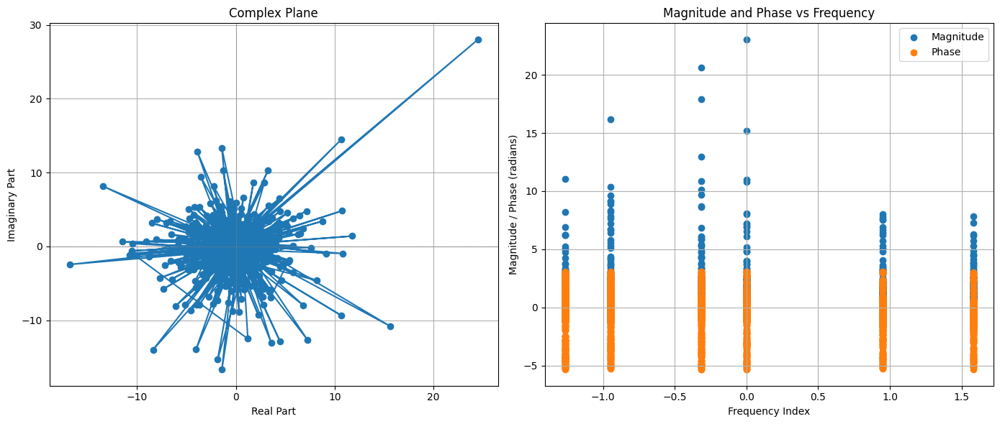

In [ ]:
# Increase the path simplification threshold
plt.rcParams['path.simplify_threshold'] = 0.5  # Adjust this value as needed

# Visualization
plt.figure(figsize=(14, 6))

# 1. Complex Plane Plot
plt.subplot(1, 2, 1)

# Sample the data for the complex plane plot
sample_size = 10000  # Adjust this value based on your needs
df_sample = df_scaled.sample(n=sample_size)

plt.plot(df_sample.real, df_sample.imaginary, marker='o')
plt.axhline(0, color='grey', linewidth=0.5, linestyle='--')
plt.axvline(0, color='grey', linewidth=0.5, linestyle='--')
plt.title('Complex Plane')
plt.xlabel('Real Part')
plt.ylabel('Imaginary Part')
plt.grid()

# 2. Magnitude and Phase
plt.subplot(1, 2, 2)

# Sample the data for the magnitude and phase plot
df_sample = df_scaled.sample(n=sample_size)

plt.scatter(df_sample.frequency_int, df_sample.magnitude, label='Magnitude')
plt.scatter(df_sample.frequency_int, df_sample.phase, label='Phase')
plt.title('Magnitude and Phase vs Frequency')
plt.xlabel('Frequency Index')
plt.ylabel('Magnitude / Phase (radians)')
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()


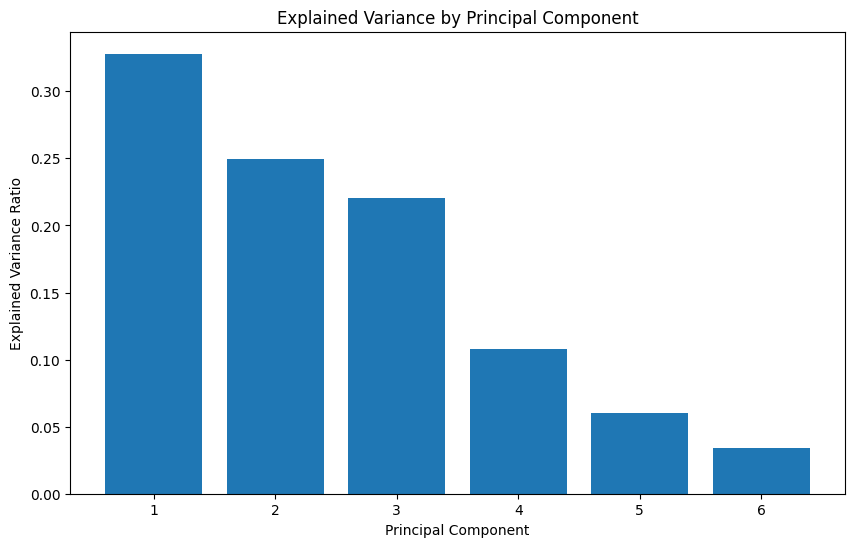

Principal Component 1: 0.3280
Principal Component 2: 0.2497
Principal Component 3: 0.2201
Principal Component 4: 0.1082
Principal Component 5: 0.0602
Principal Component 6: 0.0338


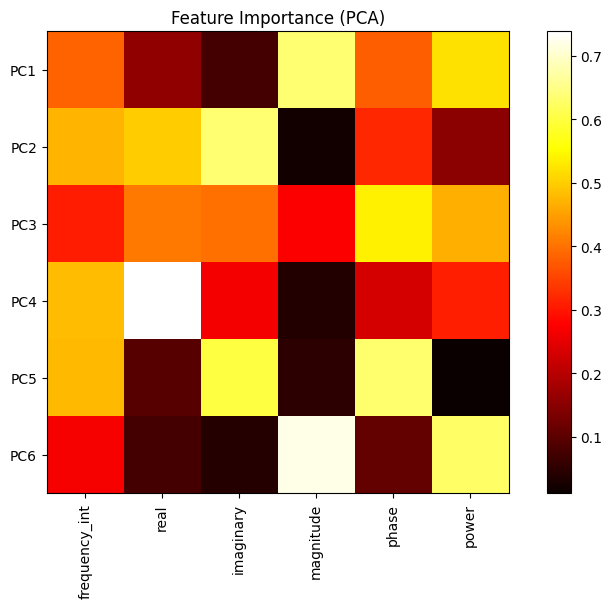

In [ ]:
# feature importance with pca on df_final_resampled

from sklearn.decomposition import PCA

# Assuming 'df_final_resampled' is your DataFrame with numerical features
X = df_scaled

# Initialize PCA.
# Set n_components to the number of features for explained variance analysis
pca = PCA(n_components=X.shape[1])

# Fit PCA to your data
pca.fit(X)

# Get explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Plot explained variance
plt.figure(figsize=(10, 6))
plt.bar(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio)
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance by Principal Component')
plt.show()

# Print explained variance for each component
for i, ratio in enumerate(explained_variance_ratio):
    print(f"Principal Component {i+1}: {ratio:.4f}")

# Get the feature importances (absolute values of components)
feature_importances = np.abs(pca.components_)

# Visualize feature importances
plt.figure(figsize=(10, 6))
plt.imshow(feature_importances, cmap='hot', interpolation='nearest')
plt.colorbar()
plt.xticks(range(X.shape[1]), X.columns, rotation=90)
plt.yticks(range(pca.n_components_), ['PC'+str(i+1) for i in range(pca.n_components_)])
plt.title('Feature Importance (PCA)')
plt.show()


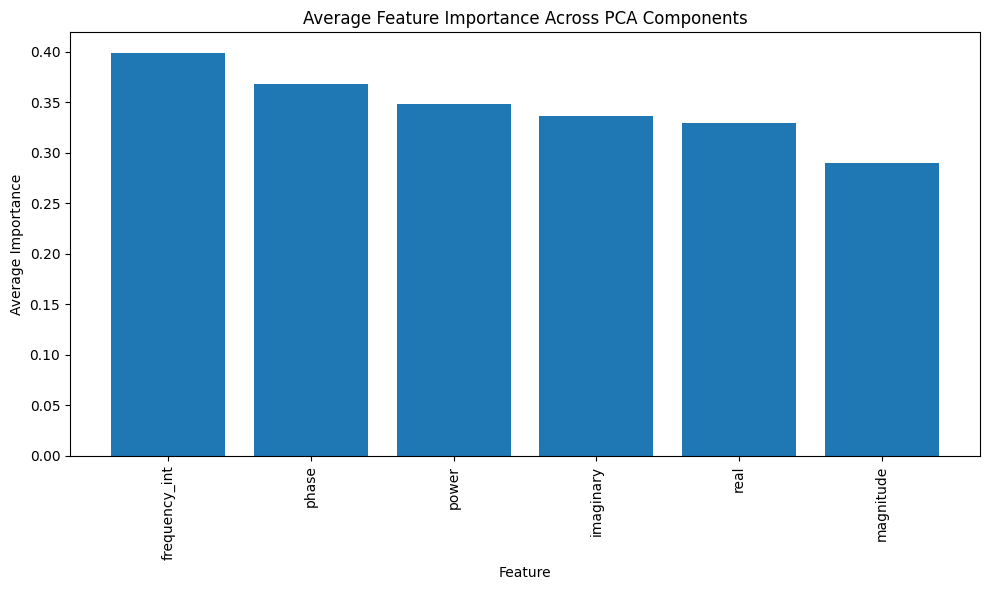

In [ ]:
# plot feature importance per feature not pca component

# Calculate the average feature importance across all components
average_importance = np.mean(feature_importances, axis=0)

# Create a DataFrame for easier plotting
importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': average_importance})

# Sort the DataFrame by importance
importance_df = importance_df.sort_values('Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.bar(importance_df['Feature'], importance_df['Importance'])
plt.xlabel('Feature')
plt.ylabel('Average Importance')
plt.title('Average Feature Importance Across PCA Components')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


In [ ]:
# get top 75 percent as features

# Calculate cumulative explained variance
cumulative_variance = np.cumsum(feature_importances)

# Find the number of components that explain 75% of the variance
n_components_75 = np.argmax(cumulative_variance >= 0.95) + 1

print("Number of components explaining 75% of variance:", n_components_75)

# Select the top features
top_features = importance_df['Feature'][:n_components_75].tolist()

print("Top features:", top_features)


Number of components explaining 75% of variance: 4
Top features: ['frequency_int', 'phase', 'power', 'imaginary']


In [ ]:
# get top features into new dataframe

# Create a new DataFrame with only the top features
df_top_features = df_scaled[top_features]

df_top_features.head()


,frequency_int,phase,power,imaginary
0,-1.264911,-3.153512,-0.131859,-0.929671
1,-0.948683,-3.231683,-0.108825,-1.344137
2,-0.316228,-3.190312,-0.023000,-2.094874
3,0.000000,-3.157904,0.043985,-2.483249
4,0.948683,-3.083823,0.303436,-3.529931


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` ex

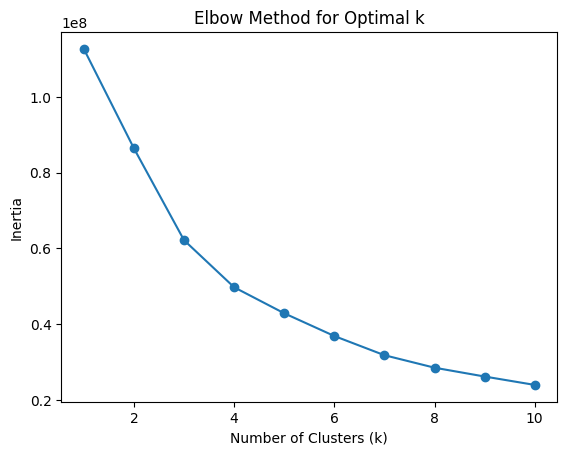

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
<ipython-input-39-db007a44d817>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top_features['cluster'] = kmeans.fit_predict(df_top_features)


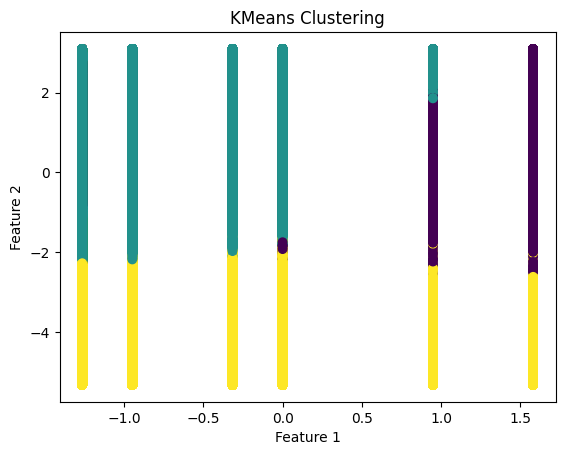

In [ ]:
# k means clustering

from sklearn.cluster import KMeans

# Determine the optimal number of clusters using the Elbow method
inertia = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(df_top_features)
    inertia.append(kmeans.inertia_)

# Plot the Elbow method graph
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.show()

# Based on the Elbow method, choose the optimal number of clusters
optimal_k = 3  # Replace with the value you determine from the graph

# Apply KMeans clustering with the optimal number of clusters
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
df_top_features['cluster'] = kmeans.fit_predict(df_top_features)

# Visualize the clusters (example using scatter plot for first two features)
plt.scatter(df_top_features.iloc[:, 0], df_top_features.iloc[:, 1], c=df_top_features['cluster'], cmap='viridis')
plt.title('KMeans Clustering')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()


Number of columns in df_top_features: 5


/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


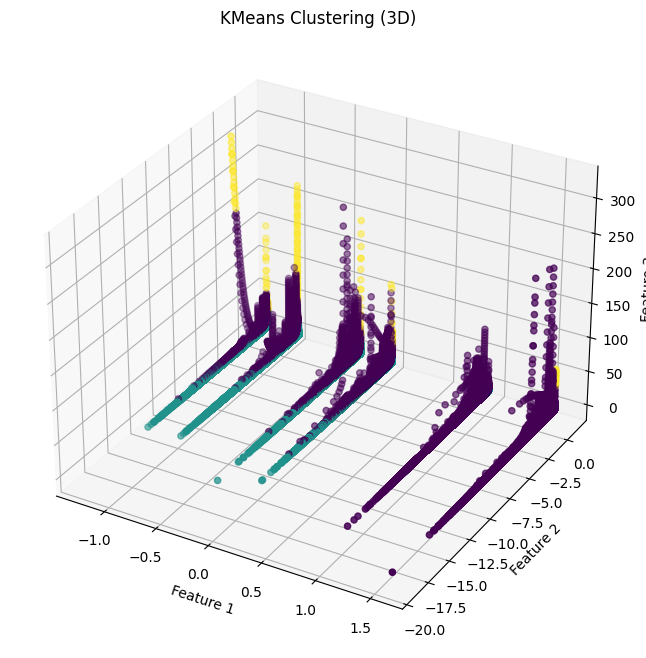

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Assuming 'df_top_features' is your DataFrame with the clustered data
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Check the number of columns in df_top_features
num_columns = df_top_features.shape[1]
print("Number of columns in df_top_features:", num_columns)

# Scatter plot with colors based on clusters
# Adjust the column indices if necessary based on the number of columns
ax.scatter(df_top_features.iloc[:, 0],
           np.log(df_top_features.iloc[:, 1]),
           df_top_features.iloc[:, 2 if num_columns > 2 else 1],  # Use the second column if there are only two
           c=df_top_features['cluster'], cmap='viridis')

ax.set_xlabel('Feature 1')
ax.set_ylabel('Feature 2')
ax.set_zlabel('Feature 3')
ax.set_title('KMeans Clustering (3D)')

plt.show()


In [ ]:
df_top_features.head()

,frequency_int,phase,power,imaginary,cluster
0,-1.264911,-3.153512,-0.131859,-0.929671,2
1,-0.948683,-3.231683,-0.108825,-1.344137,2
2,-0.316228,-3.190312,-0.023000,-2.094874,2
3,0.000000,-3.157904,0.043985,-2.483249,2
4,0.948683,-3.083823,0.303436,-3.529931,2


In [ ]:
from sklearn.ensemble import IsolationForest

# Create an IsolationForest model
model = IsolationForest(contamination=0.1, max_samples=250)  # Adjust contamination as needed

# Fit the model to the scaled numerical data
model.fit(df_top_features)

# get anomaly scores
anomaly_score = model.decision_function(df_top_features)

# Identify anomalies (outliers)
anomaly = model.predict(df_top_features)

# Add the results to the DataFrame
df_top_features['anomaly_score'] = anomaly_score
df_top_features['anomaly'] = anomaly

# Print the number of anomalies detected
print("Number of anomalies detected:", df_top_features['anomaly'].value_counts()[-1])

Number of anomalies detected: 2815747


In [ ]:
df_top_features.head()

,frequency_int,phase,power,imaginary,cluster,anomaly_score,anomaly
0,-1.264911,-3.153512,-0.131859,-0.929671,2,-0.118293,-1
1,-0.948683,-3.231683,-0.108825,-1.344137,2,-0.100484,-1
2,-0.316228,-3.190312,-0.023000,-2.094874,2,-0.105493,-1
3,0.000000,-3.157904,0.043985,-2.483249,2,-0.120830,-1
4,0.948683,-3.083823,0.303436,-3.529931,2,-0.156626,-1


/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


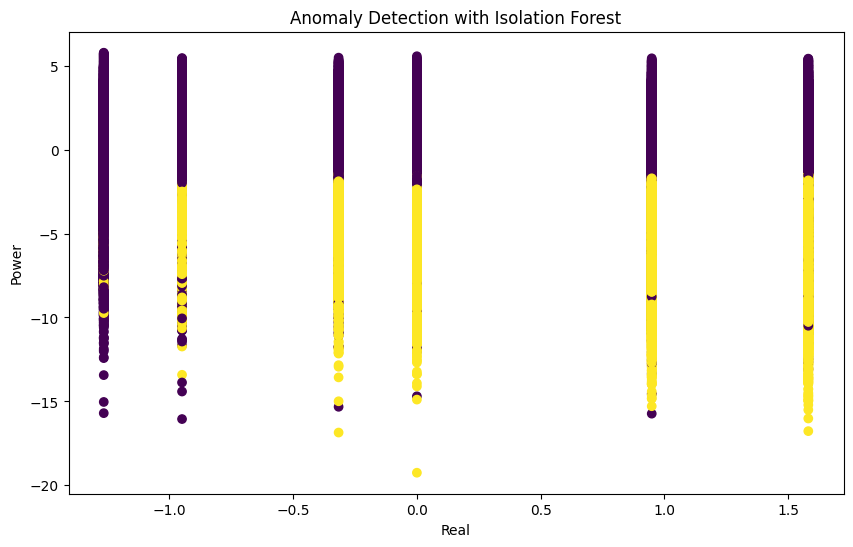

In [ ]:
# Plot anomalies (example with scatter plot for two features)
plt.figure(figsize=(10, 6))
plt.scatter(df_top_features['frequency_int'], np.log(df_top_features['power']), c=df_top_features['anomaly'], cmap='viridis')
plt.title('Anomaly Detection with Isolation Forest')
plt.xlabel('Real')
plt.ylabel('Power')
plt.show()


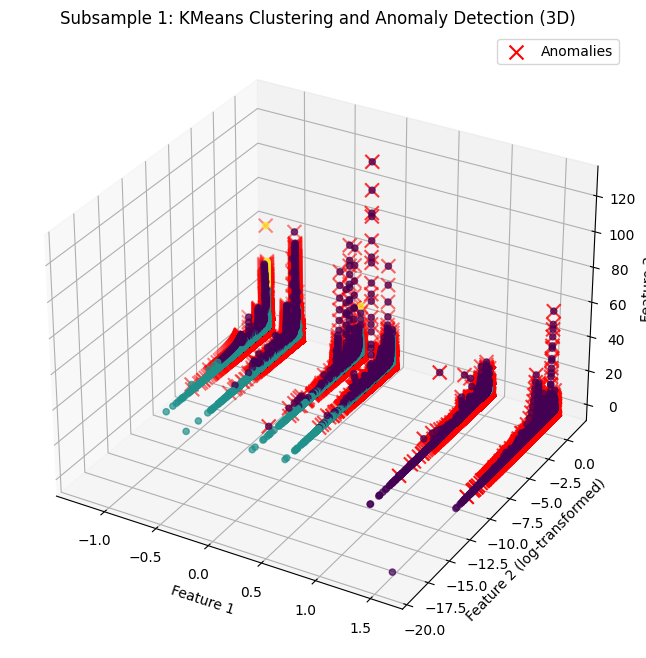

Subsample 1:
Cluster distribution: cluster
1    1640103
0     849800
2     325852
Name: count, dtype: int64
Number of anomalies: 586944




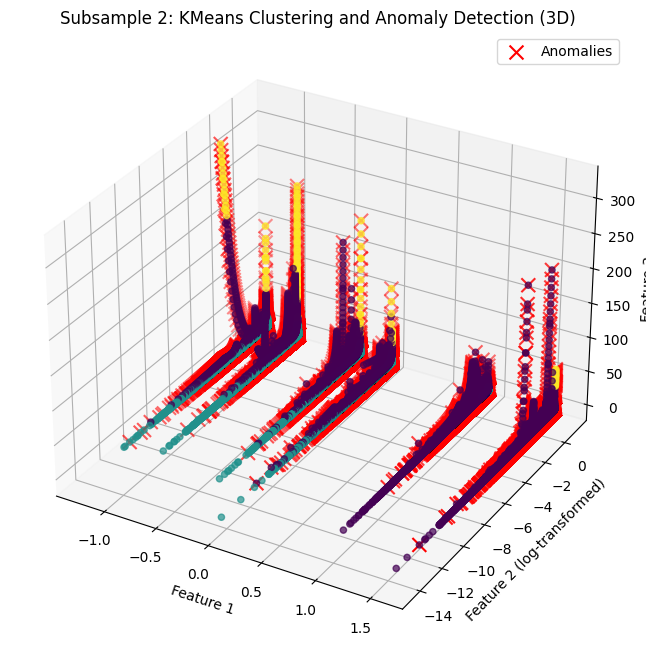

Subsample 2:
Cluster distribution: cluster
1    1564717
0     846865
2     404173
Name: count, dtype: int64
Number of anomalies: 859610




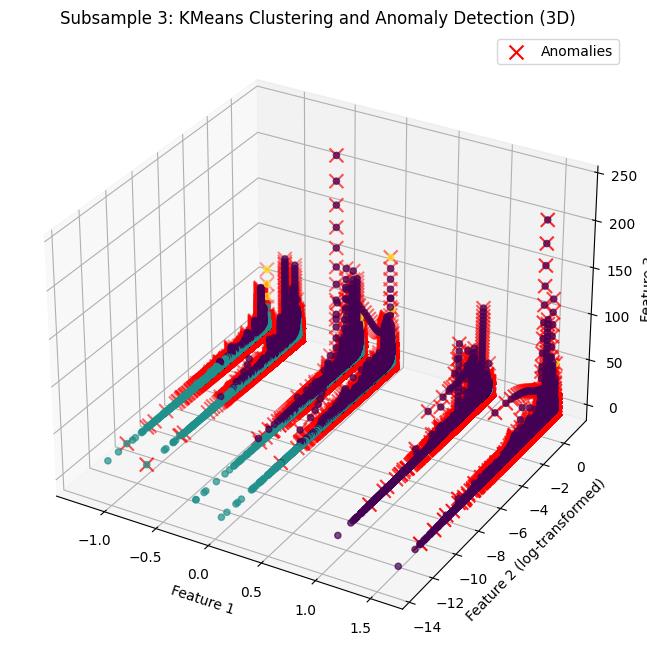

Subsample 3:
Cluster distribution: cluster
1    1582893
0     862957
2     369905
Name: count, dtype: int64
Number of anomalies: 846101




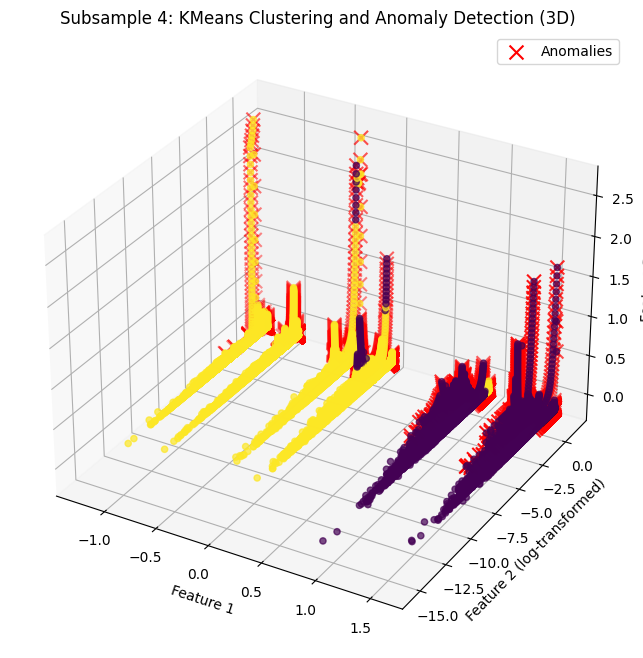

Subsample 4:
Cluster distribution: cluster
1    1849540
0     926818
2      39397
Name: count, dtype: int64
Number of anomalies: 77110




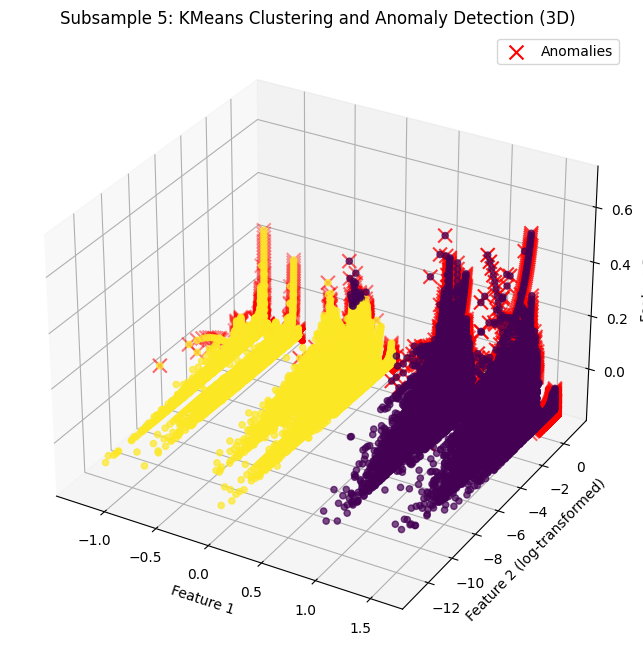

Subsample 5:
Cluster distribution: cluster
1    1860295
0     930502
2      24958
Name: count, dtype: int64
Number of anomalies: 67829




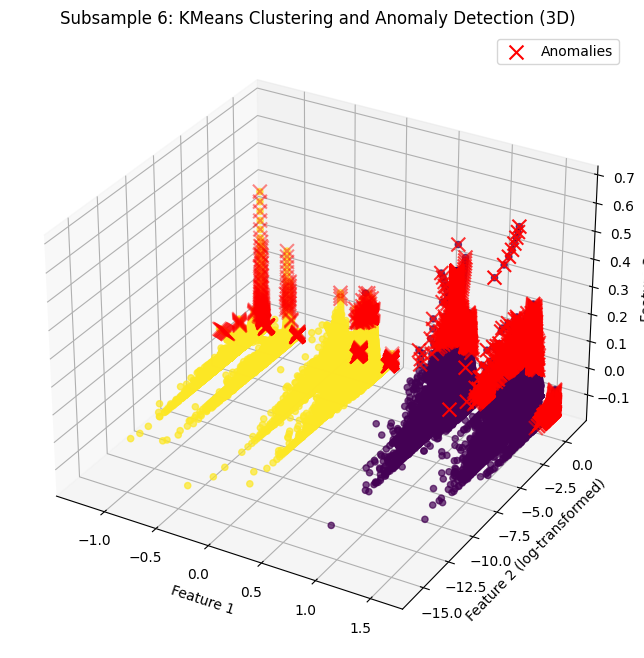

Subsample 6:
Cluster distribution: cluster
1    1848817
0     924186
2      42752
Name: count, dtype: int64
Number of anomalies: 116349




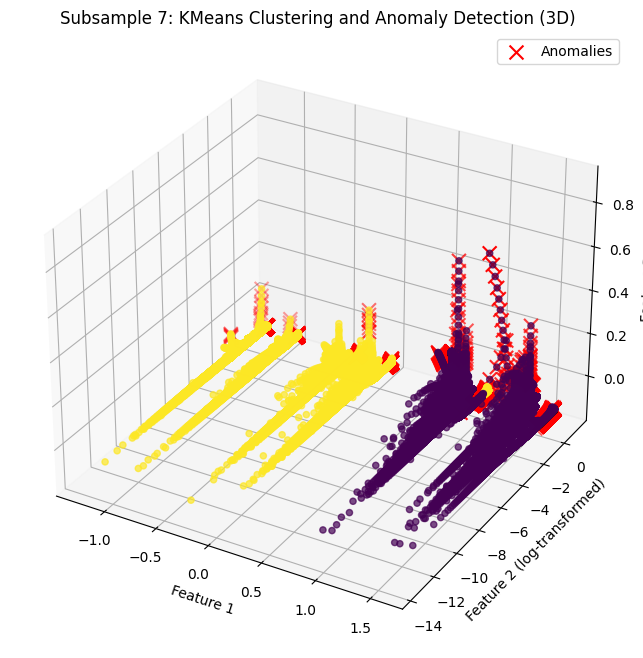

Subsample 7:
Cluster distribution: cluster
1    1871790
0     935503
2       8462
Name: count, dtype: int64
Number of anomalies: 33873




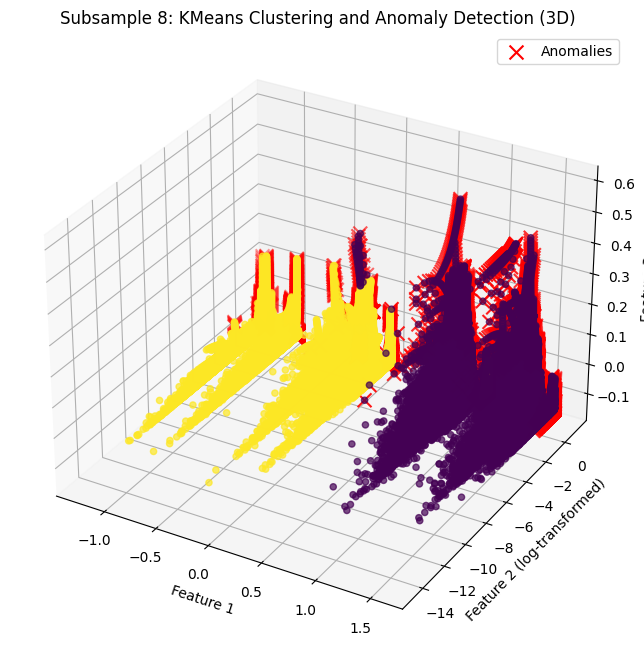

Subsample 8:
Cluster distribution: cluster
1    1864555
0     931200
2      20000
Name: count, dtype: int64
Number of anomalies: 74570




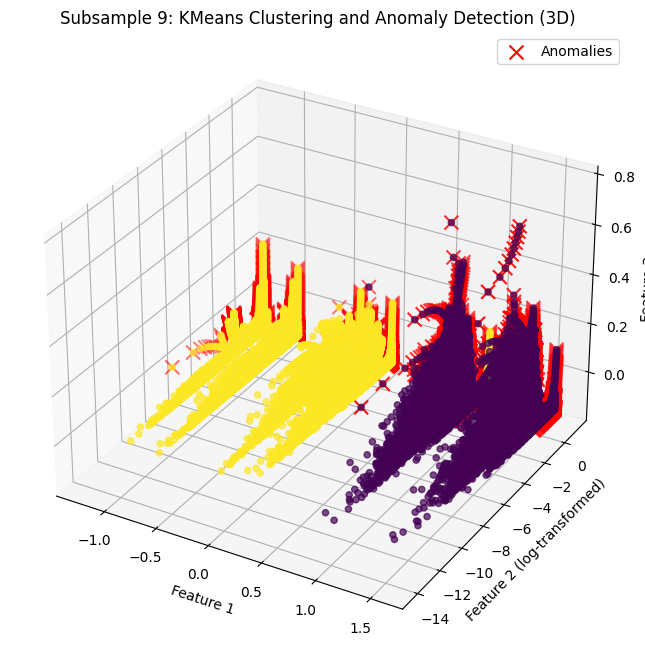

Subsample 9:
Cluster distribution: cluster
1    1868411
0     933617
2      13727
Name: count, dtype: int64
Number of anomalies: 83361




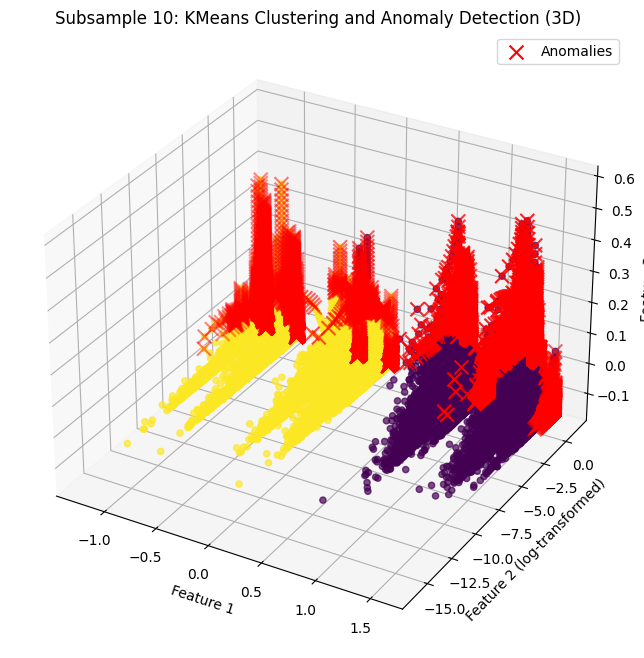

Subsample 10:
Cluster distribution: cluster
1    1865185
0     932721
2      17849
Name: count, dtype: int64
Number of anomalies: 70000




In [ ]:
# Get cluster assignments and anomaly results
cluster_assignments = df_top_features['cluster']
anomaly_results = df_top_features['anomaly']

# Split into 10 subsamples
num_subsamples = 10
subsample_size = len(df_top_features) // num_subsamples

cluster_subsamples = []
anomaly_subsamples = []
df_subsamples = [] # Store DataFrame subsamples
for i in range(num_subsamples):
  start = i * subsample_size
  end = (i + 1) * subsample_size
  cluster_subsamples.append(cluster_assignments[start:end])
  anomaly_subsamples.append(anomaly_results[start:end])
  df_subsamples.append(df_top_features.iloc[start:end]) # Store the corresponding DataFrame slice

# Plot and analyze using 3D plots
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

for i in range(num_subsamples):
  fig = plt.figure(figsize=(10, 8))
  ax = fig.add_subplot(111, projection='3d')

  # Scatter plot with colors based on clusters and anomaly results
  ax.scatter(df_subsamples[i].iloc[:, 0],
             np.log(df_subsamples[i].iloc[:, 1]),
             df_subsamples[i].iloc[:, 2],
             c=cluster_subsamples[i], cmap='viridis', alpha=0.7)

  # Highlight anomalies in red
  # Use the DataFrame subsample to ensure index alignment
  anomalies = df_subsamples[i][anomaly_subsamples[i] == -1]
  ax.scatter(anomalies.iloc[:, 0],
             np.log(anomalies.iloc[:, 1]),
             anomalies.iloc[:, 2],
             c='red', marker='x', s=100, label='Anomalies')

  ax.set_xlabel('Feature 1')
  ax.set_ylabel('Feature 2 (log-transformed)')
  ax.set_zlabel('Feature 3')
  ax.set_title(f'Subsample {i+1}: KMeans Clustering and Anomaly Detection (3D)')
  ax.legend()

  plt.show()

  # Analyze cluster distribution and anomalies within the subsample
  print(f"Subsample {i+1}:")
  print("Cluster distribution:", cluster_subsamples[i].value_counts())
  print("Number of anomalies:", anomaly_subsamples[i].value_counts()[-1])
  print("\n")


1. What initial analysis would you apply to understand the structure and
characteristics of the dataset?
- How would you summarize and visualize the distribution of features?
- What patterns or anomalies would you look for in univariate and bivariate
analyses?
2. Which methods would you employ to analyze the relationships between
different features?
- How would you use correlation analysis, scatter plots, or other tools to
uncover potential insights?
3. What types of visualizations would you create to effectively communicate your
findings?
- How would you choose appropriate visualization methods to highlight key
aspects of the data?

# Key Findings

1. What significant patterns or trends did you uncover in the data?

As time changes, we can clearly see the cluster patterns change as well which could indicate the populization on the unkown group of data.

# Recommendations


1. Based on your analysis, what actionable recommendations would you provide
to create value from the unknown data?
- How could these insights be utilized to improve the sensor technology or
waste management processes?
2. What strategies would you suggest for handling and leveraging the increasing
volume of unknown data?

Time binning and analyzing the cluster and anomaly results to see the changes would be a good step.

Finding out the ideal binning strategy will be helpful.

Labeling different occuring clusters as time goes on and examining their physical properties for correct labeling can let some supervised methods do some modeling on the data.



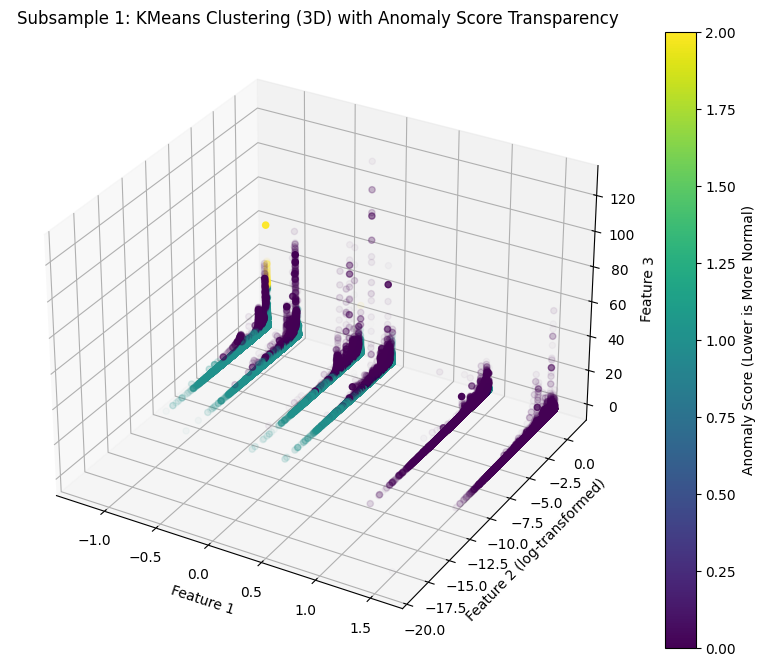

Subsample 1:
Cluster distribution): cluster
1    1640103
0     849800
2     325852
Name: count, dtype: int64
Anomaly score statistics:
count    2.815755e+06
mean     6.435748e-02
std      9.889306e-02
min     -2.960383e-01
25%      2.896813e-02
50%      1.048463e-01
75%      1.372644e-01
max      1.570973e-01
Name: anomaly_score, dtype: float64




/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


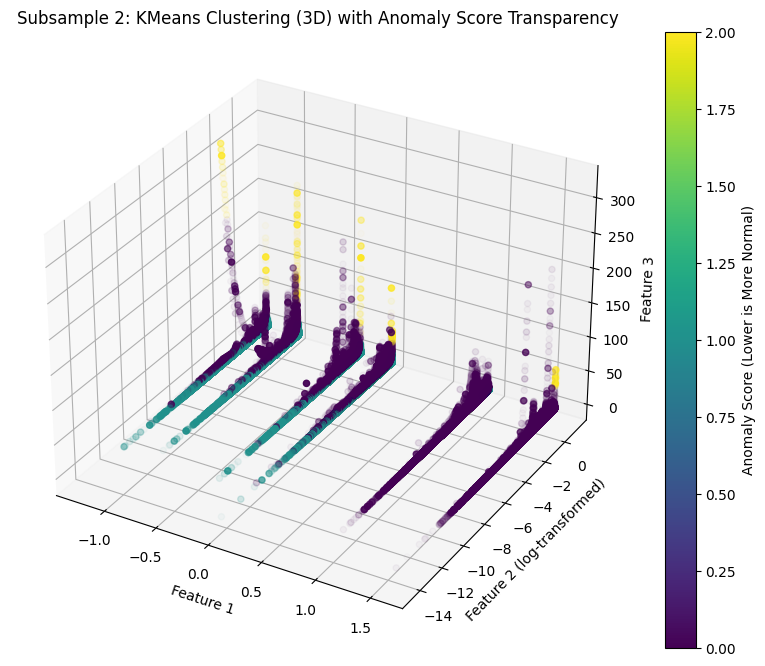

Subsample 2:
Cluster distribution): cluster
1    1564717
0     846865
2     404173
Name: count, dtype: int64
Anomaly score statistics:
count    2.815755e+06
mean     3.681943e-02
std      1.171786e-01
min     -2.982587e-01
25%     -4.855789e-02
50%      9.202943e-02
75%      1.335166e-01
max      1.570973e-01
Name: anomaly_score, dtype: float64




/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


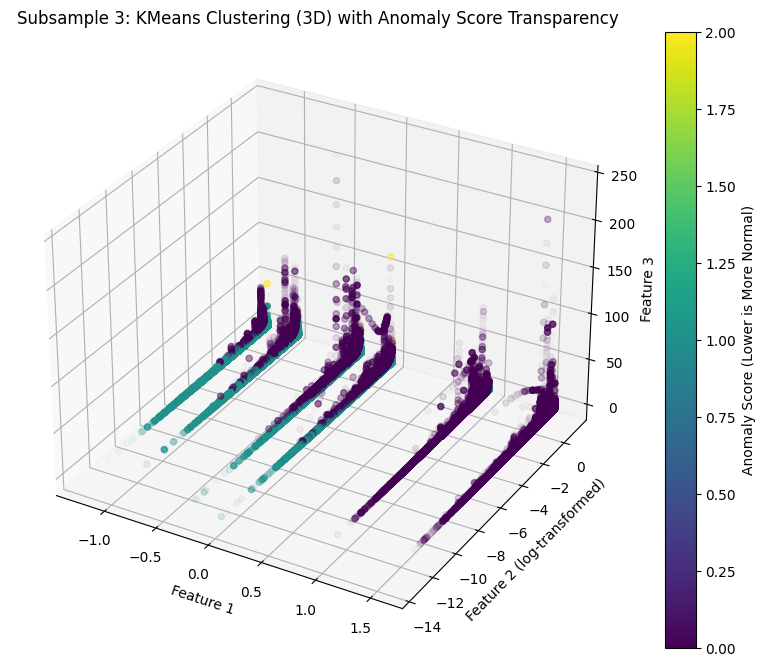

Subsample 3:
Cluster distribution): cluster
1    1582893
0     862957
2     369905
Name: count, dtype: int64
Anomaly score statistics:
count    2.815755e+06
mean     3.937377e-02
std      1.189167e-01
min     -2.982587e-01
25%     -4.681499e-02
50%      9.650963e-02
75%      1.360089e-01
max      1.570973e-01
Name: anomaly_score, dtype: float64




/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


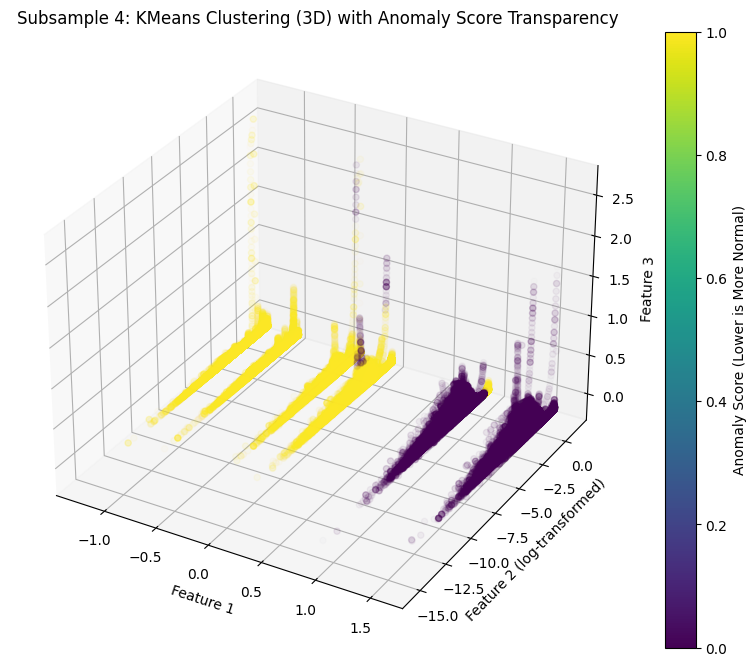

Subsample 4:
Cluster distribution): cluster
1    1849540
0     926818
2      39397
Name: count, dtype: int64
Anomaly score statistics:
count    2.815755e+06
mean     1.089728e-01
std      4.519648e-02
min     -2.393644e-01
25%      9.334460e-02
50%      1.207023e-01
75%      1.401959e-01
max      1.570973e-01
Name: anomaly_score, dtype: float64




/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


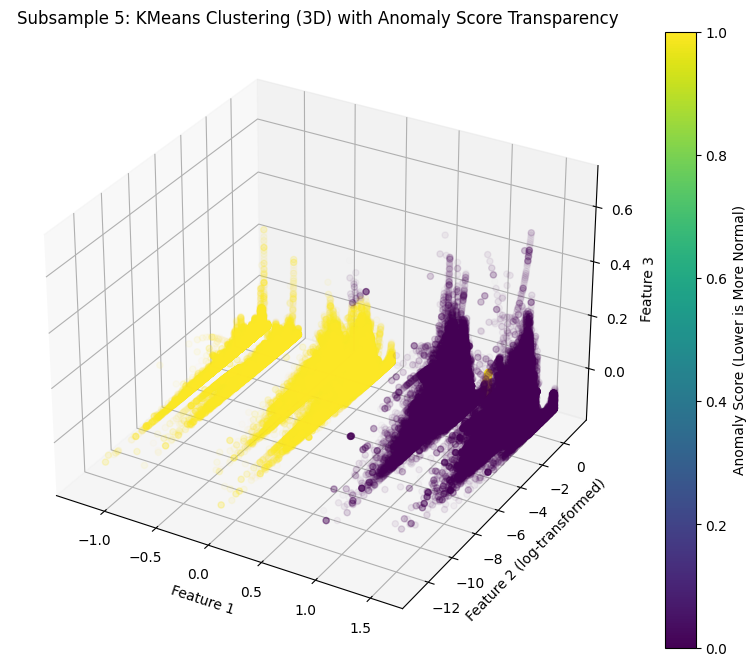

Subsample 5:
Cluster distribution): cluster
1    1860295
0     930502
2      24958
Name: count, dtype: int64
Anomaly score statistics:
count    2.815755e+06
mean     1.076103e-01
std      4.349733e-02
min     -1.676288e-01
25%      9.104441e-02
50%      1.182090e-01
75%      1.394748e-01
max      1.570973e-01
Name: anomaly_score, dtype: float64




/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


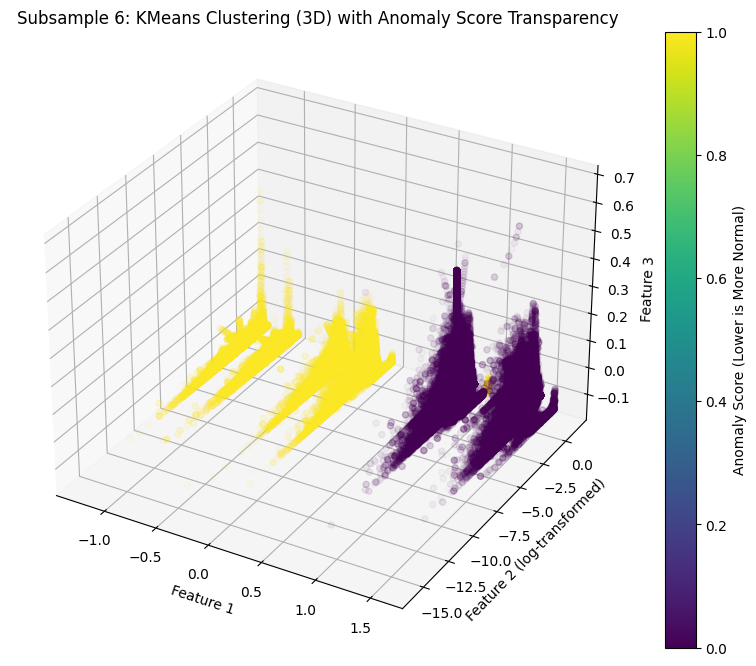

Subsample 6:
Cluster distribution): cluster
1    1848817
0     924186
2      42752
Name: count, dtype: int64
Anomaly score statistics:
count    2.815755e+06
mean     1.037024e-01
std      4.960222e-02
min     -1.671619e-01
25%      8.649911e-02
50%      1.153879e-01
75%      1.398360e-01
max      1.570973e-01
Name: anomaly_score, dtype: float64




/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


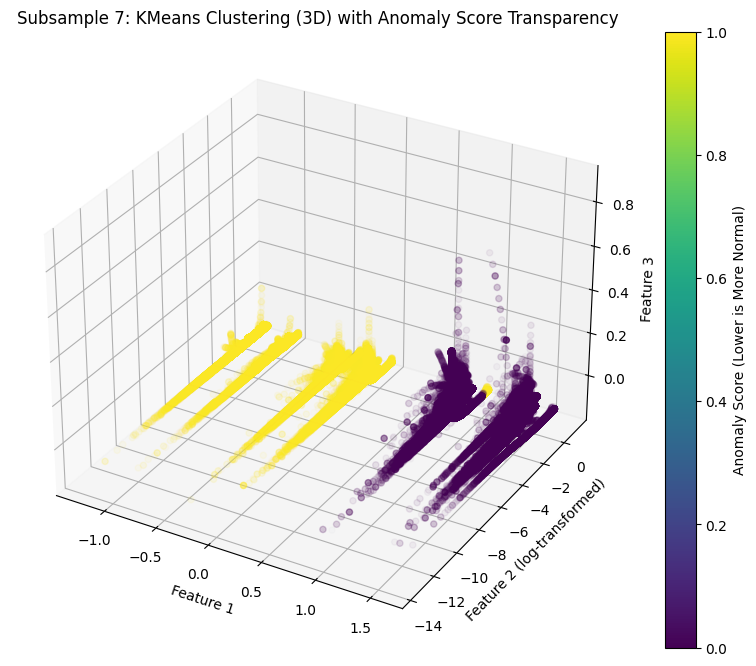

Subsample 7:
Cluster distribution): cluster
1    1871790
0     935503
2       8462
Name: count, dtype: int64
Anomaly score statistics:
count    2.815755e+06
mean     1.117959e-01
std      3.656487e-02
min     -1.666953e-01
25%      9.346738e-02
50%      1.226862e-01
75%      1.392889e-01
max      1.570973e-01
Name: anomaly_score, dtype: float64




/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


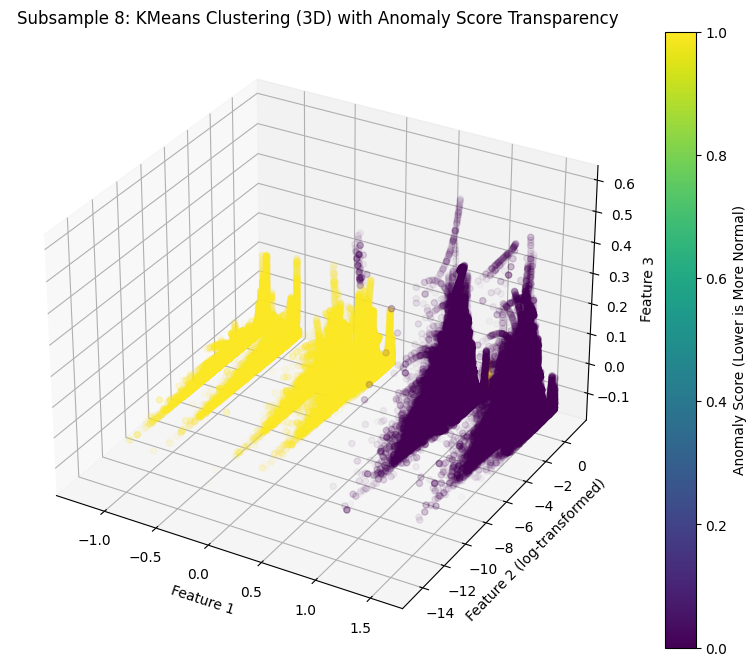

Subsample 8:
Cluster distribution): cluster
1    1864555
0     931200
2      20000
Name: count, dtype: int64
Anomaly score statistics:
count    2.815755e+06
mean     1.091741e-01
std      4.303482e-02
min     -1.680960e-01
25%      9.348752e-02
50%      1.210907e-01
75%      1.401538e-01
max      1.570973e-01
Name: anomaly_score, dtype: float64




/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


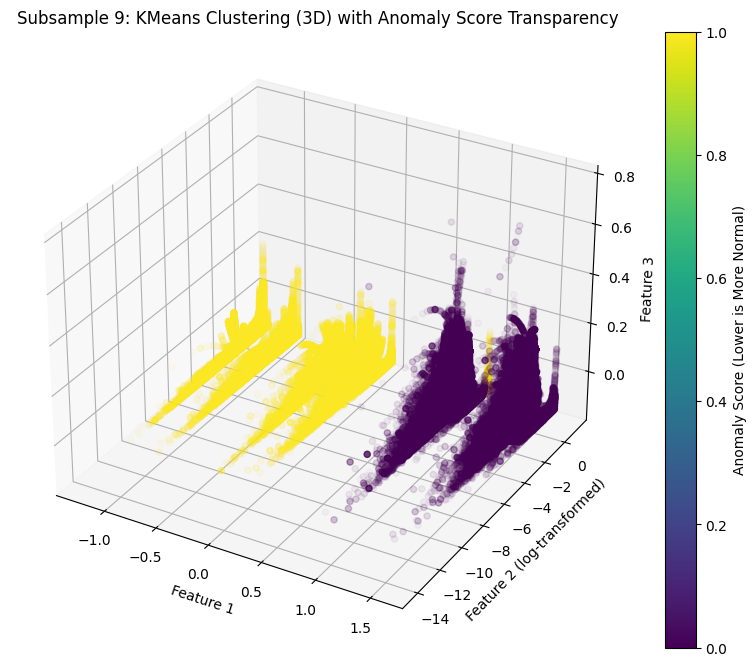

Subsample 9:
Cluster distribution): cluster
1    1868411
0     933617
2      13727
Name: count, dtype: int64
Anomaly score statistics:
count    2.815755e+06
mean     1.067587e-01
std      4.375290e-02
min     -1.730997e-01
25%      8.911910e-02
50%      1.182918e-01
75%      1.394508e-01
max      1.570973e-01
Name: anomaly_score, dtype: float64




/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


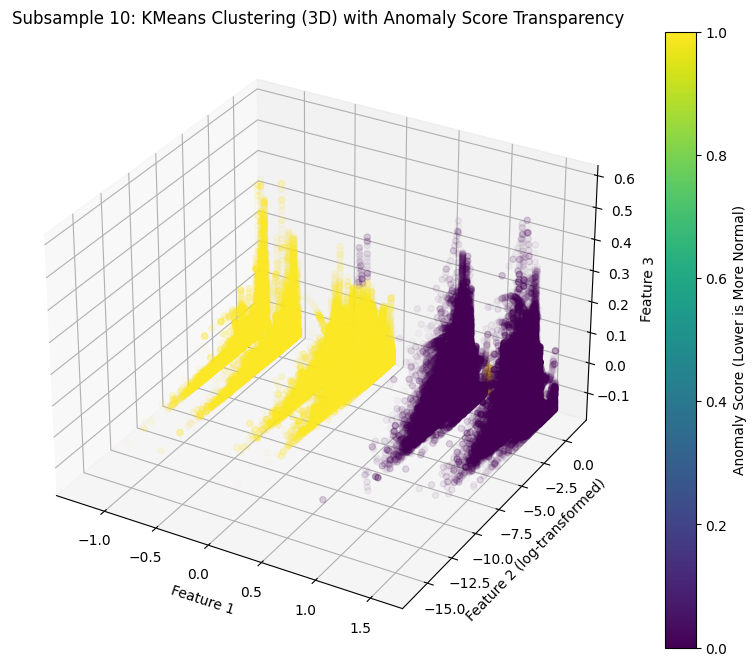

Subsample 10:
Cluster distribution): cluster
1    1865185
0     932721
2      17849
Name: count, dtype: int64
Anomaly score statistics:
count    2.815755e+06
mean     1.085916e-01
std      4.281914e-02
min     -1.694853e-01
25%      9.217746e-02
50%      1.203486e-01
75%      1.399683e-01
max      1.570973e-01
Name: anomaly_score, dtype: float64




In [ ]:
# plot clusters without anomalies as above use anomaly_scores

# Get cluster assignments and anomaly scores
cluster_assignments = df_top_features['cluster']
anomaly_scores = df_top_features['anomaly_score']

# Split into 10 subsamples
num_subsamples = 10
subsample_size = len(df_top_features) // num_subsamples

cluster_subsamples = []
anomaly_score_subsamples = []
df_subsamples = []
for i in range(num_subsamples):
  start = i * subsample_size
  end = (i + 1) * subsample_size
  # Ensure end index does not exceed the length of the DataFrame
  end = min(end, len(df_top_features))
  cluster_subsamples.append(cluster_assignments[start:end])
  anomaly_score_subsamples.append(anomaly_scores[start:end])
  df_subsamples.append(df_top_features.iloc[start:end])

# Plot and analyze using 3D plots
for i in range(num_subsamples):
  fig = plt.figure(figsize=(10, 8))
  ax = fig.add_subplot(111, projection='3d')

  # Scatter plot with colors based on clusters and anomaly scores
  # Points with lower anomaly scores (more normal) will be more opaque
  # Adjust the scaling of anomaly scores to alpha (transparency) as needed
  alpha_values = 1 - (anomaly_score_subsamples[i] - anomaly_score_subsamples[i].min()) / (anomaly_score_subsamples[i].max() - anomaly_score_subsamples[i].min())

  # Ensure alpha values are within [0, 1]
  alpha_values = np.clip(alpha_values, 0, 1)

  # Extract data for plotting and handle potential errors with np.log
  x_data = df_subsamples[i].iloc[:, 0]
  y_data = df_subsamples[i].iloc[:, 1]
  z_data = df_subsamples[i].iloc[:, 2]

  # Handle potential errors with np.log (e.g., log of zero or negative values)
  y_data_log = np.log(y_data.replace(0, np.nan))  # Replace zeros with NaN

  # Remove rows with NaN values to ensure consistent shapes
  valid_indices = ~np.isnan(y_data_log)
  x_data = x_data[valid_indices]
  y_data_log = y_data_log[valid_indices]
  z_data = z_data[valid_indices]
  alpha_values = alpha_values[valid_indices]

  # Use ax.scatter3D instead of ax.scatter for 3D plotting
  scatter = ax.scatter3D(x_data,
                        y_data_log,
                        z_data,
                        c=cluster_subsamples[i][valid_indices], cmap='viridis', alpha=alpha_values)

  ax.set_xlabel('Feature 1')
  ax.set_ylabel('Feature 2 (log-transformed)')
  ax.set_zlabel('Feature 3')
  ax.set_title(f'Subsample {i+1}: KMeans Clustering (3D) with Anomaly Score Transparency')

  # Add a colorbar for anomaly scores
  fig.colorbar(scatter, ax=ax, label='Anomaly Score (Lower is More Normal)')

  plt.show()

  # Analyze cluster distribution and anomaly scores within the subsample
  print(f"Subsample {i+1}:")
  print("Cluster distribution):", cluster_subsamples[i].value_counts())
  print("Anomaly score statistics:")
  print(anomaly_score_subsamples[i].describe())
  print("\n")

We can see that as the time passes, the total amount of anomalous score points differ too, the earlier we observe there are less anomaly observed and as time progresses. We can see more anomalies in the data.

# Conclusions

1. What are the main conclusions from your exploration and analysis of the
dataset?
2. What limitations did you encounter during the analysis, and how might they
affect the results?
3. What are the next steps for further analysis or data collection that could
enhance the understanding and application of the sensor technology?

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


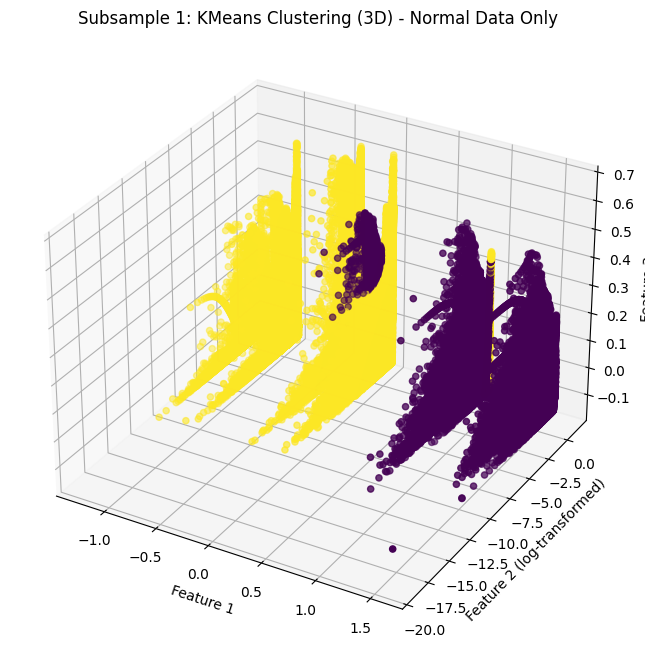

Subsample 1:
Cluster distribution: cluster
1    1727699
0     862544
2      68678
Name: count, dtype: int64




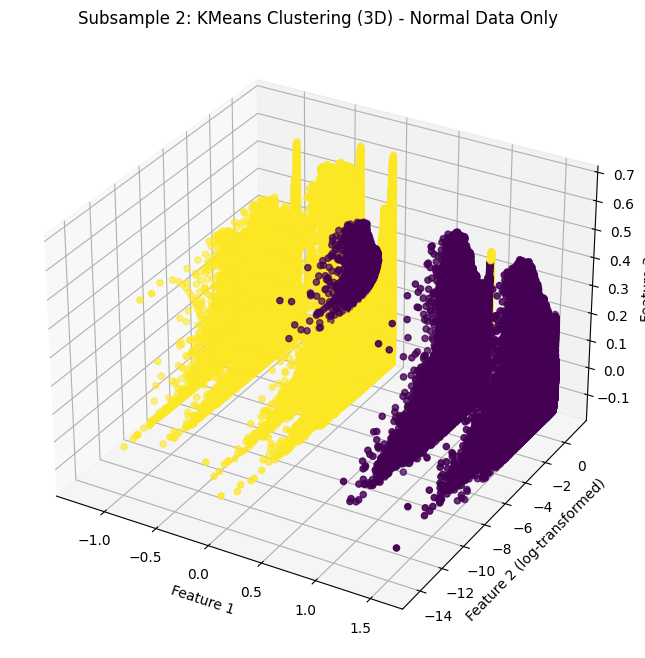

Subsample 2:
Cluster distribution: cluster
1    1751126
0     886072
2      21723
Name: count, dtype: int64




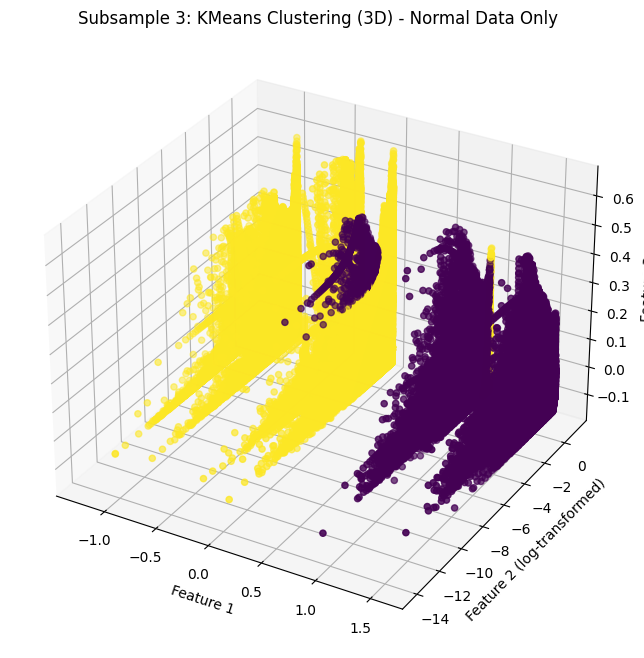

Subsample 3:
Cluster distribution: cluster
1    1753768
0     890892
2      14261
Name: count, dtype: int64




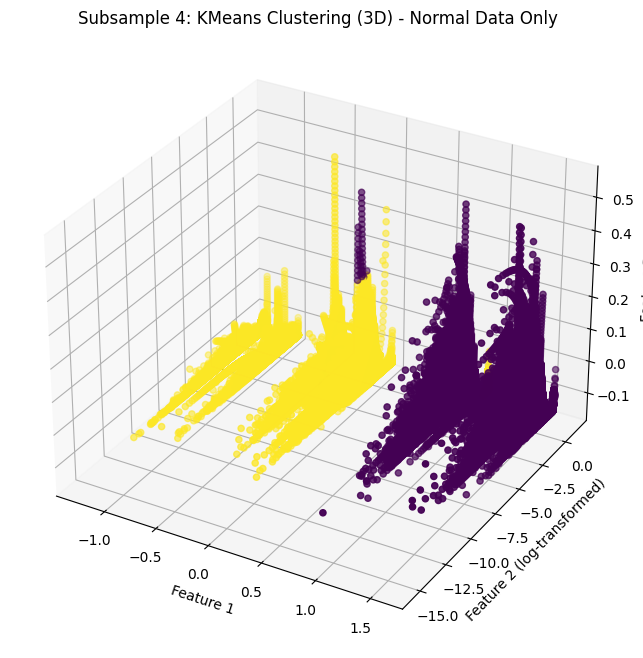

Subsample 4:
Cluster distribution: cluster
1    1763297
0     883470
2      12154
Name: count, dtype: int64




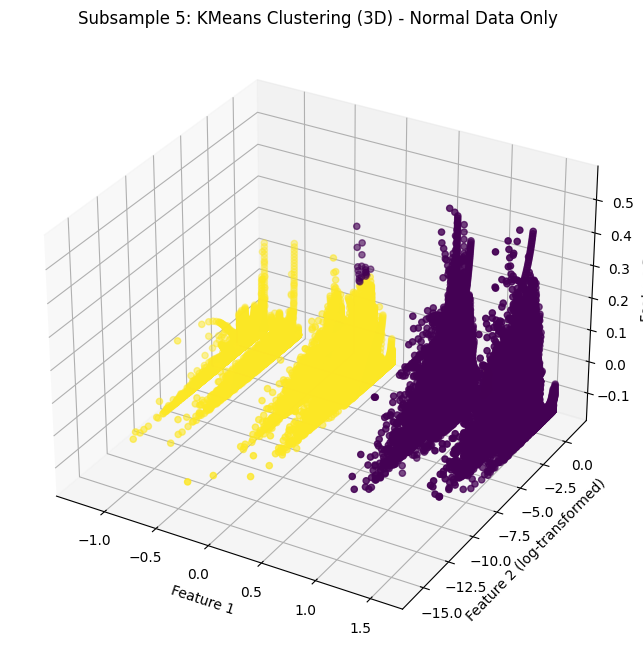

Subsample 5:
Cluster distribution: cluster
1    1770300
0     884249
2       4372
Name: count, dtype: int64




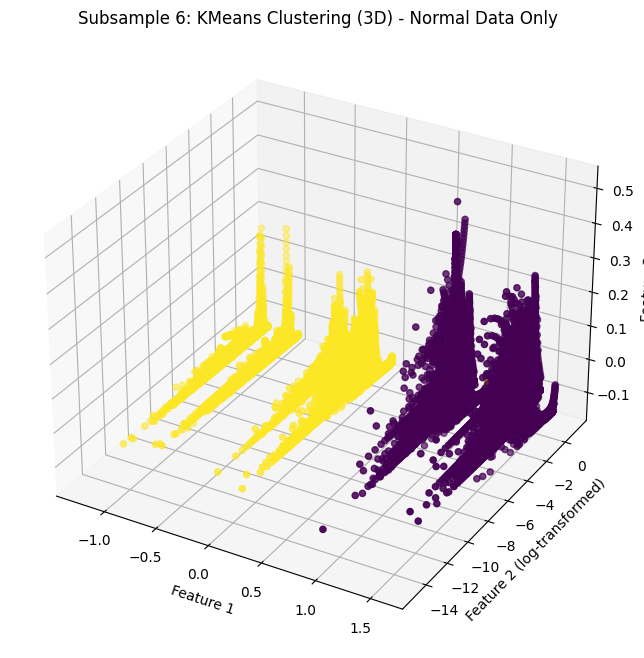

Subsample 6:
Cluster distribution: cluster
1    1765935
0     880917
2      12069
Name: count, dtype: int64




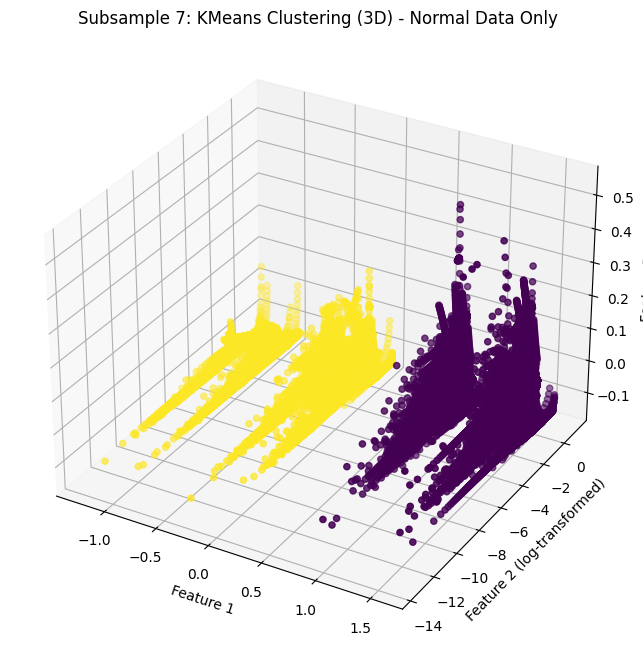

Subsample 7:
Cluster distribution: cluster
1    1771755
0     885757
2       1409
Name: count, dtype: int64




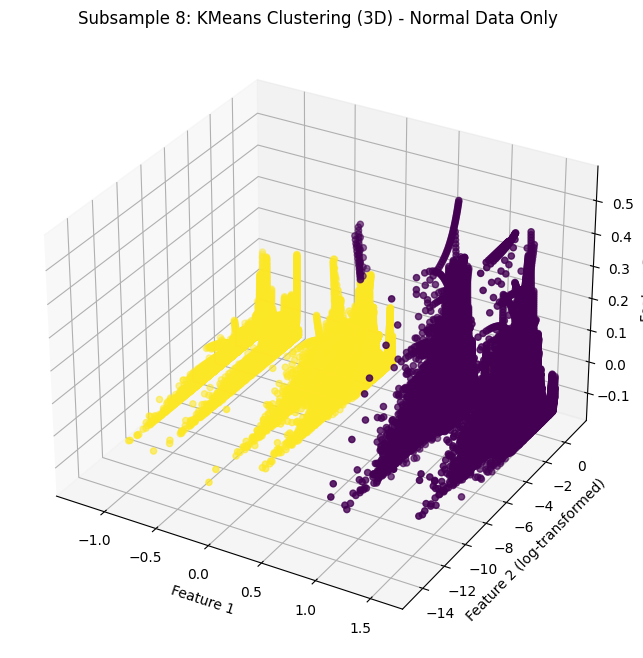

Subsample 8:
Cluster distribution: cluster
1    1771657
0     884305
2       2959
Name: count, dtype: int64




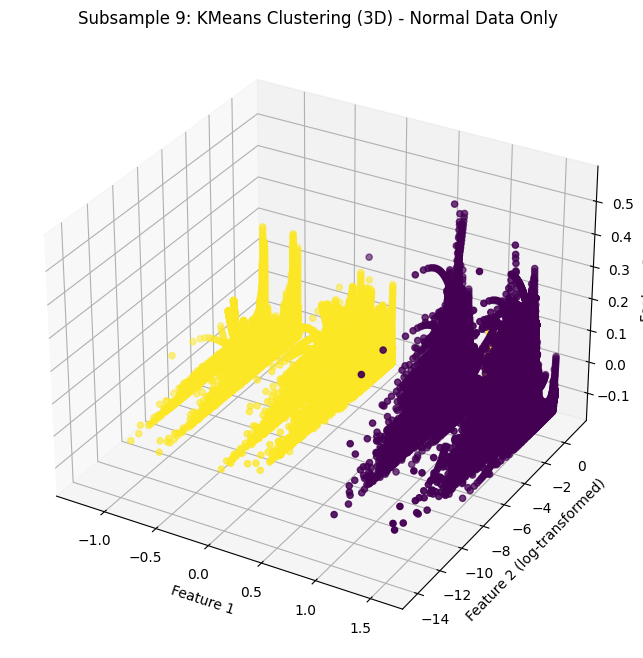

Subsample 9:
Cluster distribution: cluster
1    1771694
0     884763
2       2464
Name: count, dtype: int64




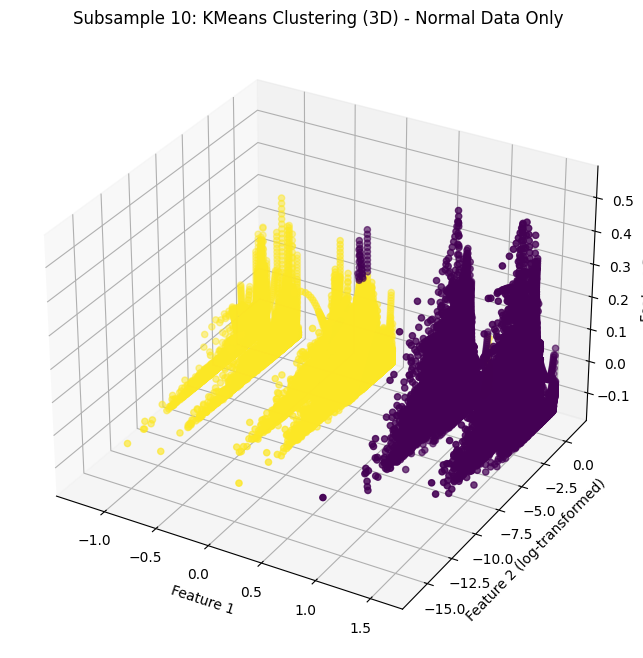

Subsample 10:
Cluster distribution: cluster
1    1770450
0     885177
2       3294
Name: count, dtype: int64




In [ ]:
# plot clusters without anomalies as above use anomaly_scores

# Get cluster assignments and anomaly scores
cluster_assignments = df_top_features['cluster']
anomaly_scores = df_top_features['anomaly_score']

# Filter out anomalies (adjust threshold as needed)
anomaly_threshold = -0.1  # Example threshold
normal_data = df_top_features[anomaly_scores > anomaly_threshold]
normal_clusters = cluster_assignments[anomaly_scores > anomaly_threshold]

# Split into 10 subsamples (adjust as needed)
num_subsamples = 10
subsample_size = len(normal_data) // num_subsamples

cluster_subsamples = []
df_subsamples = []
for i in range(num_subsamples):
  start = i * subsample_size
  end = (i + 1) * subsample_size
  end = min(end, len(normal_data))  # Ensure end index does not exceed data length
  cluster_subsamples.append(normal_clusters[start:end])
  df_subsamples.append(normal_data.iloc[start:end])

# Plot and analyze using 3D plots
for i in range(num_subsamples):
  fig = plt.figure(figsize=(10, 8))
  ax = fig.add_subplot(111, projection='3d')

  # Scatter plot with colors based on clusters
  ax.scatter(df_subsamples[i].iloc[:, 0],
             np.log(df_subsamples[i].iloc[:, 1]),
             df_subsamples[i].iloc[:, 2],
             c=cluster_subsamples[i], cmap='viridis')

  ax.set_xlabel('Feature 1')
  ax.set_ylabel('Feature 2 (log-transformed)')
  ax.set_zlabel('Feature 3')
  ax.set_title(f'Subsample {i+1}: KMeans Clustering (3D) - Normal Data Only')

  plt.show()

  # Analyze cluster distribution within the subsample
  print(f"Subsample {i+1}:")
  print("Cluster distribution:", cluster_subsamples[i].value_counts())
  print("\n")



With the formation of a feature as well as target data set, the understanding on the dataset can be greatly increased, giving way to be able to utilize both traditional and deep learning methods to be used.

In depth time series analysis on specific groups of materials (or clusters) could give great insight to the data.

Excluding the anomalies from the dataset seems to reduce the number of clusters.